In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification, make_moons, make_circles
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, classification_report
from matplotlib.colors import ListedColormap
from sklearn.utils import resample
from sklearn.preprocessing import MinMaxScaler

In [2]:
def generate_datasets(n_samples=500, noise_level=0.5, class_sep = 2.5):
    datasets = {}

    scaler = MinMaxScaler()

    spread = 1  # Controls how tightly points are clustered

    # Generate Data
    X_0 = np.array([(1.1 + np.random.uniform(-spread, spread),
                     1.1 + np.random.uniform(-spread, spread)) for _ in range(n_samples // 2)])

    X_1 = np.array([(1.1 + np.random.uniform(-spread, spread),
                     -1.1 + np.random.uniform(-spread, spread)) for _ in range(n_samples // 2)])

    X_sep = np.vstack((X_0, X_1))
    y_sep = np.hstack((np.zeros(n_samples // 2), np.ones(n_samples // 2)))

    X_sep = scaler.fit_transform(X_sep)

    datasets['Seperated'] = (X_sep, y_sep)


    cluster_size = int(n_samples * 0.5)  # 70% of points in cluster
    line_size = n_samples - cluster_size  # Remaining points in a line

    # Generate clustered points (Class 0)
    mean_cluster = [0, 0]  # Centered at origin
    cov_cluster = [[1.5, 0.7], [0.7, 1.5]]  # Covariance for elliptical shape
    X_cluster = np.random.multivariate_normal(mean_cluster, cov_cluster, cluster_size)

    # Generate linear points (Class 1)
    x_line = np.linspace(-3, 3, line_size)  # Line from left to right
    y_line = -x_line + np.random.normal(0, noise_level, line_size)  # Small noise on line
    X_line = np.column_stack((x_line, y_line))

    # Combine datasets
    X_tl = np.vstack((X_cluster, X_line))
    y_tl = np.hstack((np.zeros(cluster_size), np.ones(line_size)))

    X_tl = scaler.fit_transform(X_tl)


    datasets['Two Lines'] = (X_tl, y_tl)

    X_moons, y_moons = make_moons(n_samples=n_samples, noise=noise_level)

    X_moons = scaler.fit_transform(X_moons)


    datasets['Moons'] = (X_moons, y_moons)

    X_circles, y_circles = make_circles(n_samples=n_samples, factor=0.3, noise=noise_level)
    X_circles = scaler.fit_transform(X_circles)

    datasets['Circles'] = (X_circles, y_circles)

    # X_random, y_random = make_circles(n_samples=n_samples, noise=0.5, factor=0)

    X_random = np.random.random_sample((n_samples, 2))
    y_random = np.random.randint(0, 2, n_samples)
    # X_random, y_random = make_classification(n_samples=n_samples, n_features=2, n_redundant=0, n_classes=2, n_clusters_per_class=1)
    X_random = scaler.fit_transform(X_random)

    datasets['Random'] = (X_random, y_random)


    X_chess = np.random.rand(n_samples, 2) * 2 - 1  # Points in range [-1, 1]



    margin = 0.1

    y_chess = ((X_chess[:, 0] * X_chess[:, 1] > margin) | (X_chess[:, 0] * X_chess[:, 1] < -margin)).astype(int)

    # X_chess = scaler.fit_transform(X_chess)
    # y_chess = scaler.fit_transform(y_chess)


    datasets['Cross'] = (X_chess, y_chess)

    return datasets


In [3]:
def plot_datasets(datasets):
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.ravel()

    for i, (name, (X, y)) in enumerate(datasets.items()):

        axes[i].scatter(X[:, 0], X[:, 1], c=y, cmap='coolwarm', edgecolor='k')
        axes[i].set_title(name)

    plt.tight_layout()
    plt.show()



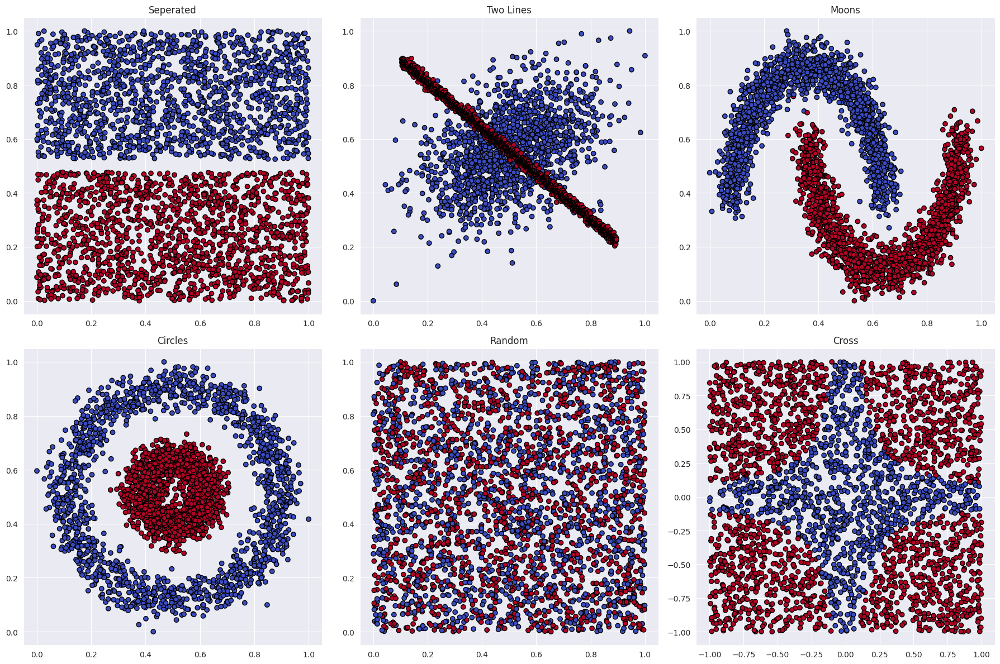

In [4]:
# Generate and plot datasets
datasets = generate_datasets(n_samples=3000, noise_level=0.1)
plot_datasets(datasets)

In [5]:
def plot_decision_boundary(model, X, y, ax):
    """Plots decision boundary for a 2D dataset on a given subplot axis."""
    h = 0.02  # Step size for meshgrid
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    try:
        if hasattr(model, "predict_proba"):
            Z = model.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1] > 0.5
        elif hasattr(model, "decision_function"):
            Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()]) > 0
        else:
            Z = model.predict(np.c_[xx.ravel(), yy.ravel()])

        Z = Z.reshape(xx.shape)

        # Plot decision regions
        ax.contourf(xx, yy, Z, alpha=0.3, cmap=ListedColormap(['#FFAAAA', '#AAAAFF']))
        ax.contour(xx, yy, Z, levels=[0], colors='black', linewidths=2)
        scatter = ax.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', cmap=ListedColormap(['red', 'blue']))

        # Labels
        ax.set_xlabel("Feature 1")
        ax.set_ylabel("Feature 2")

    except Exception as e:
        # ax.set_title("Error: Decision Boundary Unavailable")
        print(f"Error plotting decision boundary: {e}")


In [23]:
def evaluate_model(model, model_name, datasets):
    for name, (X, y) in datasets.items():
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)
        elif hasattr(model, "decision_function"):
            y_prob = model.decision_function(X_test)
        else:
            y_prob = None

        #validação cruzada
        # scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
        # print(f"\n{name} - {model_name}")
        # print(f"Accuracy (cross-validation): {scores.mean():.4f} ± {scores.std():.4f}")

        fig, axes = plt.subplots(1, 4, figsize=(20, 4))

        axes = axes.ravel()

        conf_matrix = confusion_matrix(y_test, y_pred)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=axes[0])
        axes[0].set_xlabel('Predicted')
        axes[0].set_ylabel('Actual')
        axes[0].set_title(f'Confusion Matrix - {name}')

        if len(np.unique(y)) == 2 and y_prob is not None:
            fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])
            roc_auc = auc(fpr, tpr)
            axes[1].plot(fpr, tpr, color='blue', label=f'AUC = {roc_auc:.2f}')
            axes[1].plot([0, 1], [0, 1], color='gray', linestyle='--')
            axes[1].set_xlabel('False Positive Rate')
            axes[1].set_ylabel('True Positive Rate')
            axes[1].set_title(f'ROC Curve - {name}')
            axes[1].legend()
        else:
            axes[1].axis('off')  # Hide this plot if ROC is not applicable



        # Decision Boundary (Only for 2D binary classification)
        if X.shape[1] == 2 and len(np.unique(y)) == 2:
            plot_decision_boundary(model, X_test, y_pred, axes[2])
            axes[2].set_title(f"Decision Boundary (Pred) - {name} ({model_name})")
        else:
            axes[2].axis('off')

        if X.shape[1] == 2 and len(np.unique(y)) == 2:
            plot_decision_boundary(model, X_test, y_test, axes[3])
            axes[3].set_title(f"Decision Boundary (Real) - {name} ({model_name})")
        else:
            axes[2].axis('off')

        plt.tight_layout()
        plt.show()

        print(f"Classification Report {name}:")
        print(classification_report(y_test, y_pred, zero_division=1))


        if X.shape[1] == 2 and len(np.unique(y)) == 2:
            plot_decision_boundary(model, X, y, f"Decision Boundary - {name} ({model_name})")

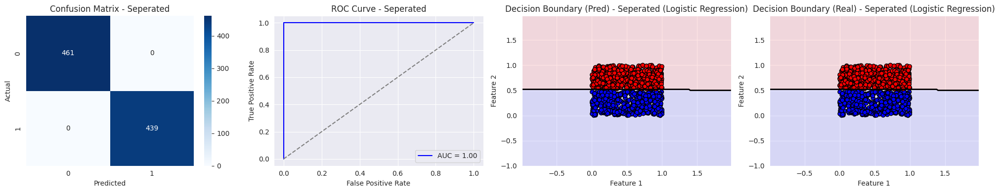

Classification Report Seperated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


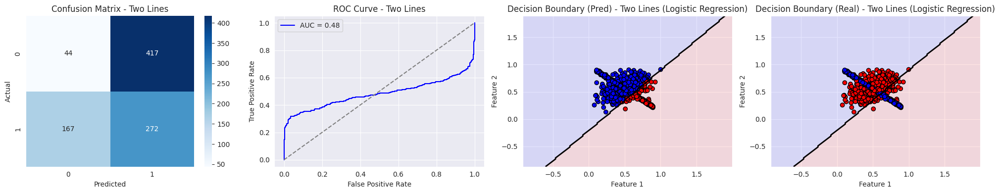

Classification Report Two Lines:
              precision    recall  f1-score   support

         0.0       0.21      0.10      0.13       461
         1.0       0.39      0.62      0.48       439

    accuracy                           0.35       900
   macro avg       0.30      0.36      0.31       900
weighted avg       0.30      0.35      0.30       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


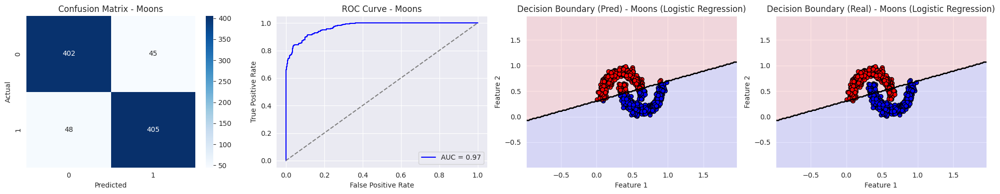

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       447
           1       0.90      0.89      0.90       453

    accuracy                           0.90       900
   macro avg       0.90      0.90      0.90       900
weighted avg       0.90      0.90      0.90       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


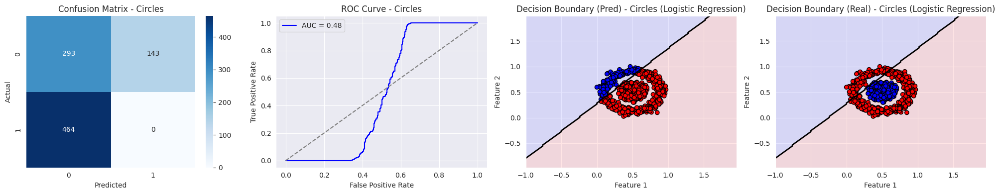

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.39      0.67      0.49       436
           1       0.00      0.00      0.00       464

    accuracy                           0.33       900
   macro avg       0.19      0.34      0.25       900
weighted avg       0.19      0.33      0.24       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


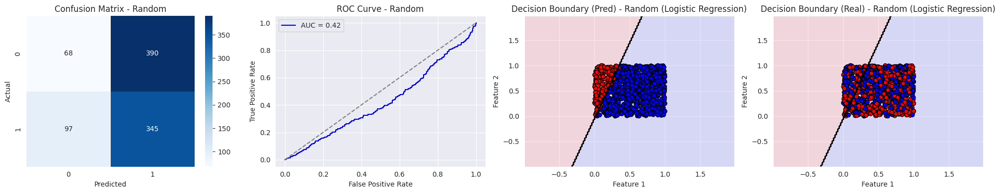

Classification Report Random:
              precision    recall  f1-score   support

           0       0.41      0.15      0.22       458
           1       0.47      0.78      0.59       442

    accuracy                           0.46       900
   macro avg       0.44      0.46      0.40       900
weighted avg       0.44      0.46      0.40       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


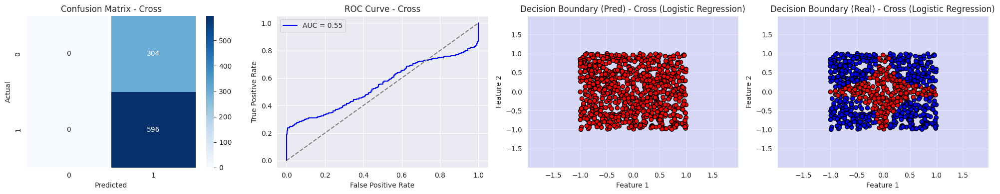

Classification Report Cross:
              precision    recall  f1-score   support

           0       1.00      0.00      0.00       304
           1       0.66      1.00      0.80       596

    accuracy                           0.66       900
   macro avg       0.83      0.50      0.40       900
weighted avg       0.78      0.66      0.53       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [24]:
evaluate_model(LogisticRegression(), "Logistic Regression", datasets)

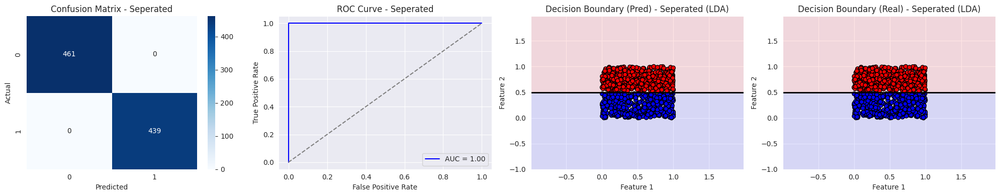

Classification Report Seperated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


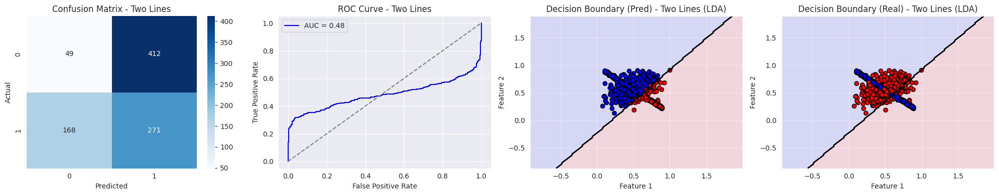

Classification Report Two Lines:
              precision    recall  f1-score   support

         0.0       0.23      0.11      0.14       461
         1.0       0.40      0.62      0.48       439

    accuracy                           0.36       900
   macro avg       0.31      0.36      0.31       900
weighted avg       0.31      0.36      0.31       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


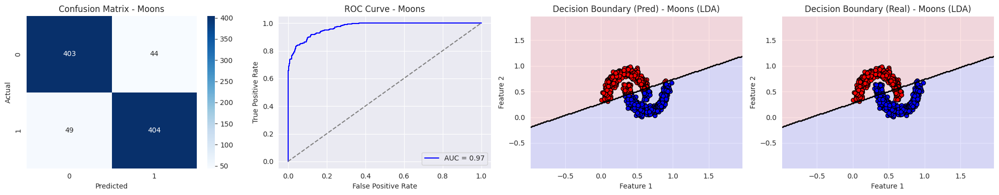

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       447
           1       0.90      0.89      0.90       453

    accuracy                           0.90       900
   macro avg       0.90      0.90      0.90       900
weighted avg       0.90      0.90      0.90       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


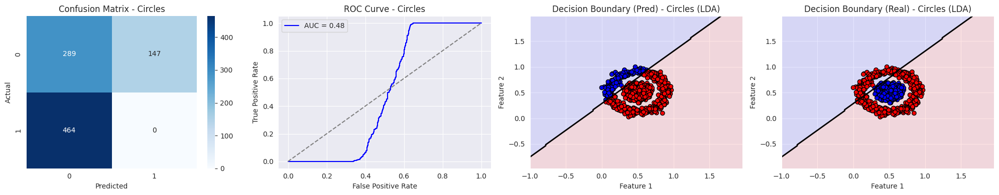

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.38      0.66      0.49       436
           1       0.00      0.00      0.00       464

    accuracy                           0.32       900
   macro avg       0.19      0.33      0.24       900
weighted avg       0.19      0.32      0.24       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


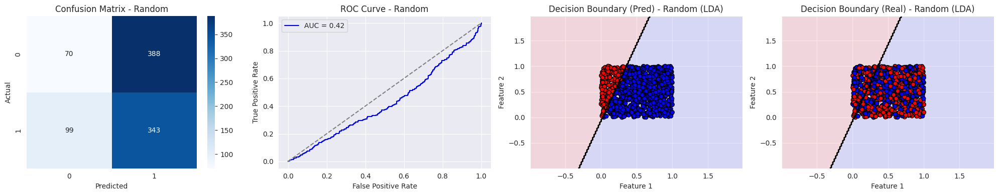

Classification Report Random:
              precision    recall  f1-score   support

           0       0.41      0.15      0.22       458
           1       0.47      0.78      0.58       442

    accuracy                           0.46       900
   macro avg       0.44      0.46      0.40       900
weighted avg       0.44      0.46      0.40       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


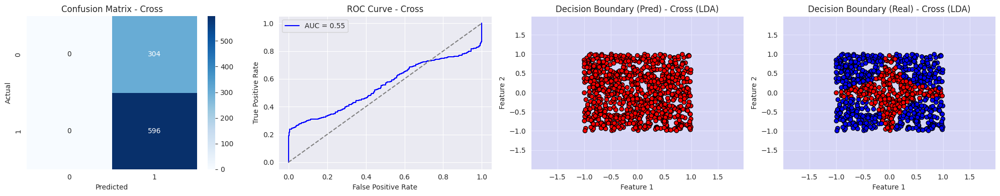

Classification Report Cross:
              precision    recall  f1-score   support

           0       1.00      0.00      0.00       304
           1       0.66      1.00      0.80       596

    accuracy                           0.66       900
   macro avg       0.83      0.50      0.40       900
weighted avg       0.78      0.66      0.53       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [25]:
evaluate_model(LinearDiscriminantAnalysis(), "LDA", datasets)

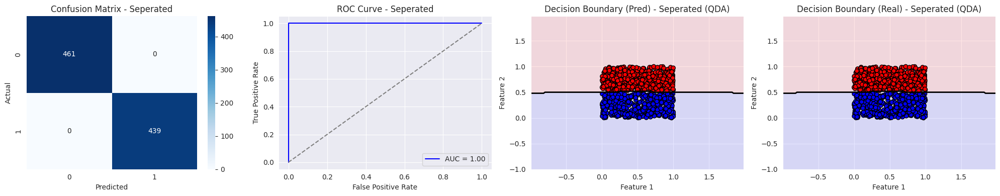

Classification Report Seperated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


/home/joaomonteiro/Desktop/ML/env_ml/lib/python3.10/site-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


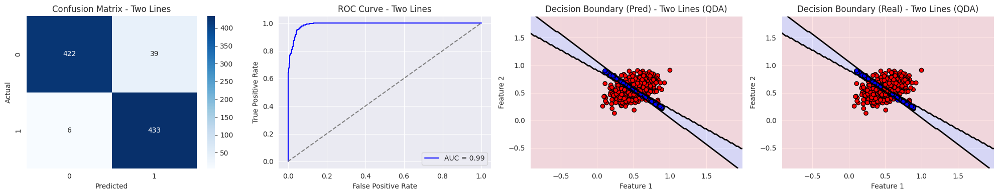

Classification Report Two Lines:
              precision    recall  f1-score   support

         0.0       0.99      0.92      0.95       461
         1.0       0.92      0.99      0.95       439

    accuracy                           0.95       900
   macro avg       0.95      0.95      0.95       900
weighted avg       0.95      0.95      0.95       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


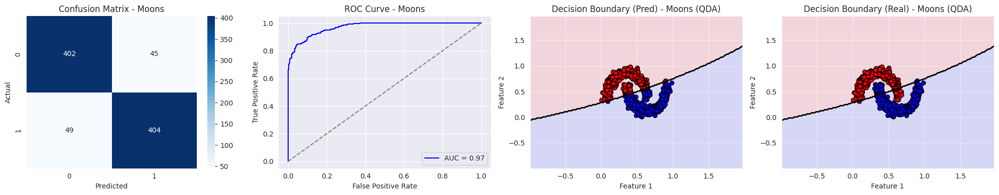

Classification Report Moons:
              precision    recall  f1-score   support

           0       0.89      0.90      0.90       447
           1       0.90      0.89      0.90       453

    accuracy                           0.90       900
   macro avg       0.90      0.90      0.90       900
weighted avg       0.90      0.90      0.90       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


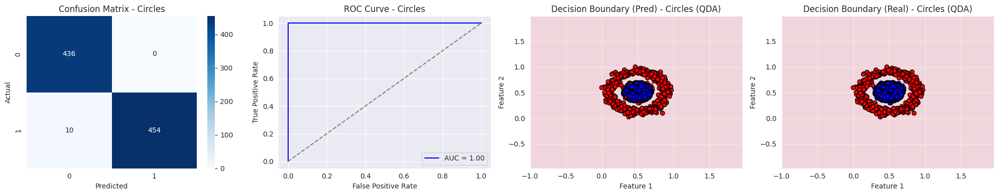

Classification Report Circles:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       436
           1       1.00      0.98      0.99       464

    accuracy                           0.99       900
   macro avg       0.99      0.99      0.99       900
weighted avg       0.99      0.99      0.99       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


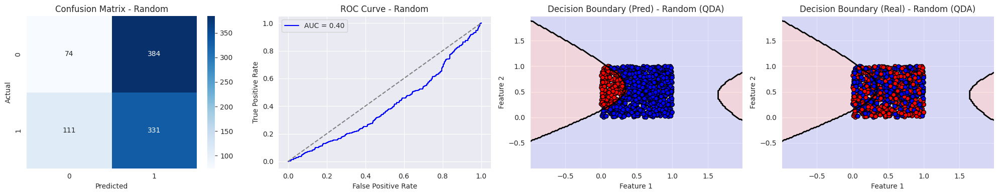

Classification Report Random:
              precision    recall  f1-score   support

           0       0.40      0.16      0.23       458
           1       0.46      0.75      0.57       442

    accuracy                           0.45       900
   macro avg       0.43      0.46      0.40       900
weighted avg       0.43      0.45      0.40       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


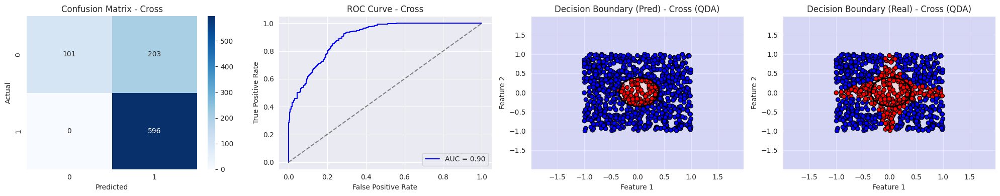

Classification Report Cross:
              precision    recall  f1-score   support

           0       1.00      0.33      0.50       304
           1       0.75      1.00      0.85       596

    accuracy                           0.77       900
   macro avg       0.87      0.67      0.68       900
weighted avg       0.83      0.77      0.73       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [26]:
evaluate_model(QuadraticDiscriminantAnalysis(), "QDA", datasets)


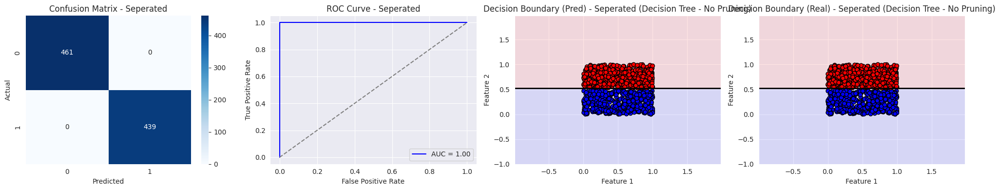

Classification Report Seperated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


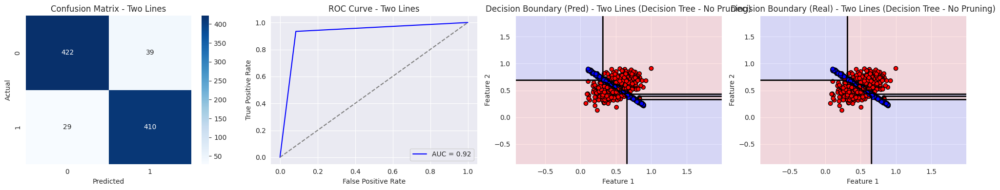

Classification Report Two Lines:
              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93       461
         1.0       0.91      0.93      0.92       439

    accuracy                           0.92       900
   macro avg       0.92      0.92      0.92       900
weighted avg       0.92      0.92      0.92       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


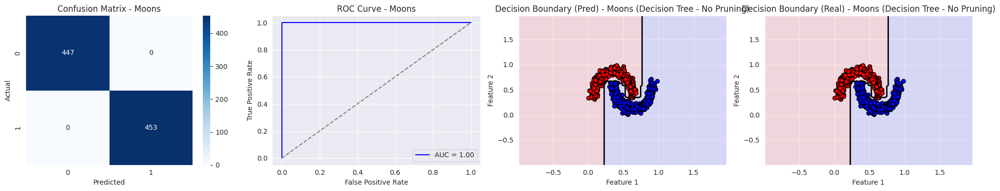

Classification Report Moons:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       447
           1       1.00      1.00      1.00       453

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


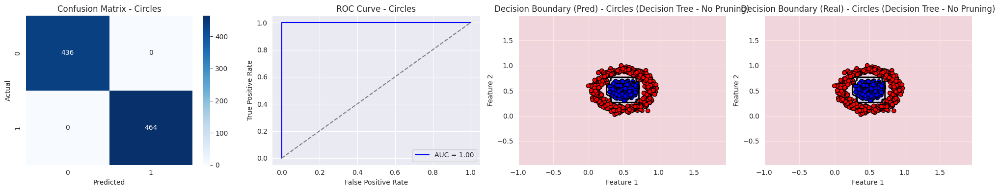

Classification Report Circles:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       436
           1       1.00      1.00      1.00       464

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


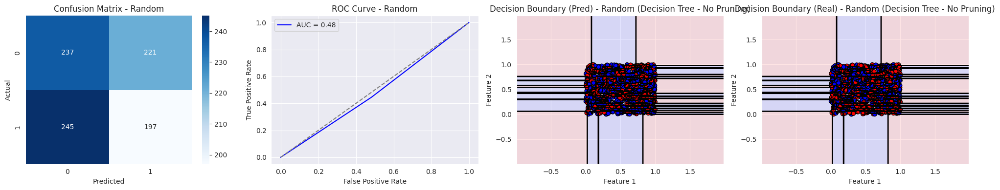

Classification Report Random:
              precision    recall  f1-score   support

           0       0.49      0.52      0.50       458
           1       0.47      0.45      0.46       442

    accuracy                           0.48       900
   macro avg       0.48      0.48      0.48       900
weighted avg       0.48      0.48      0.48       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


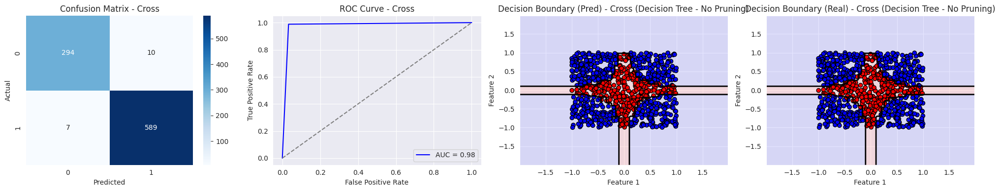

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       304
           1       0.98      0.99      0.99       596

    accuracy                           0.98       900
   macro avg       0.98      0.98      0.98       900
weighted avg       0.98      0.98      0.98       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [27]:
evaluate_model(DecisionTreeClassifier(), "Decision Tree - No Pruning", datasets)

In [28]:
from sklearn.tree import plot_tree

def plot_decision_trees_for_all_datasets(datasets, max_depth=None):
    for name, (X, y) in datasets.items():
        if len(np.unique(y)) > 2:
            continue

        model = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
        model.fit(X, y)

        plt.figure(figsize=(12, 6))
        plot_tree(model, filled=True, feature_names=["Feature 1", "Feature 2"], class_names=["Class 0", "Class 1"])
        plt.title(f"Decision Tree - {name} ")
        plt.show()


Decision Trees without pruning:


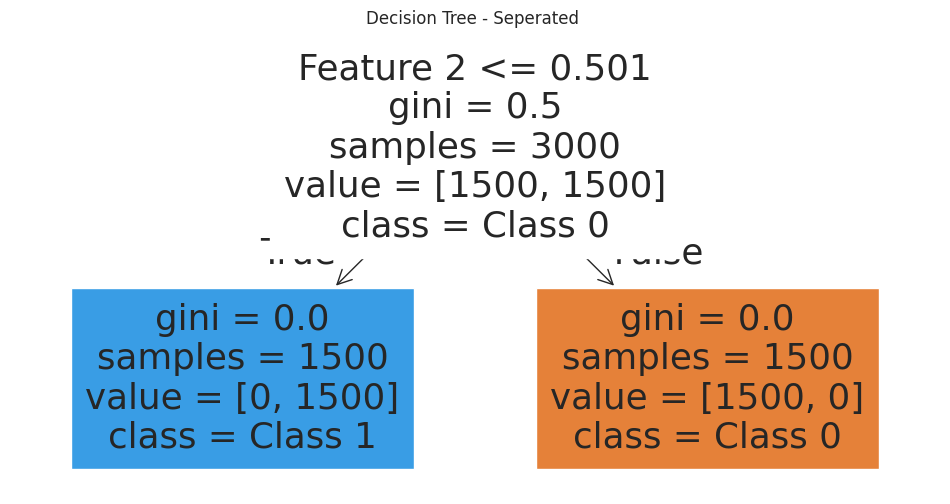

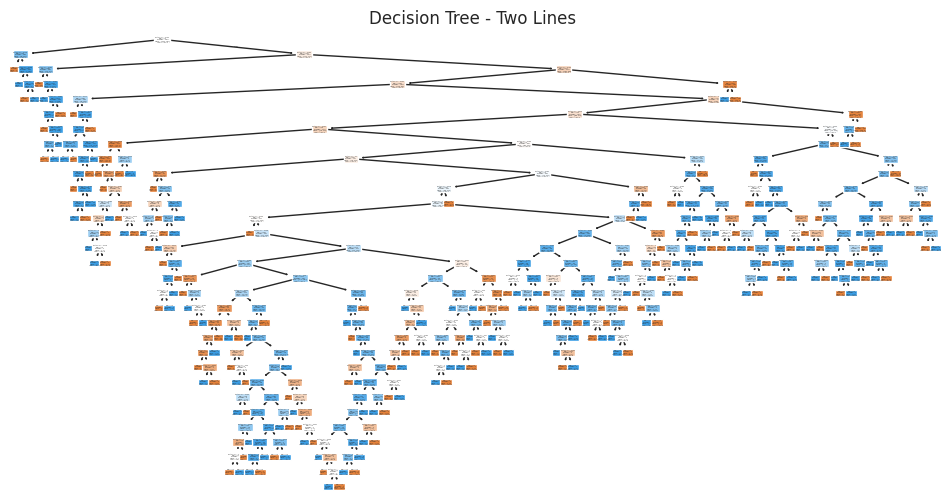

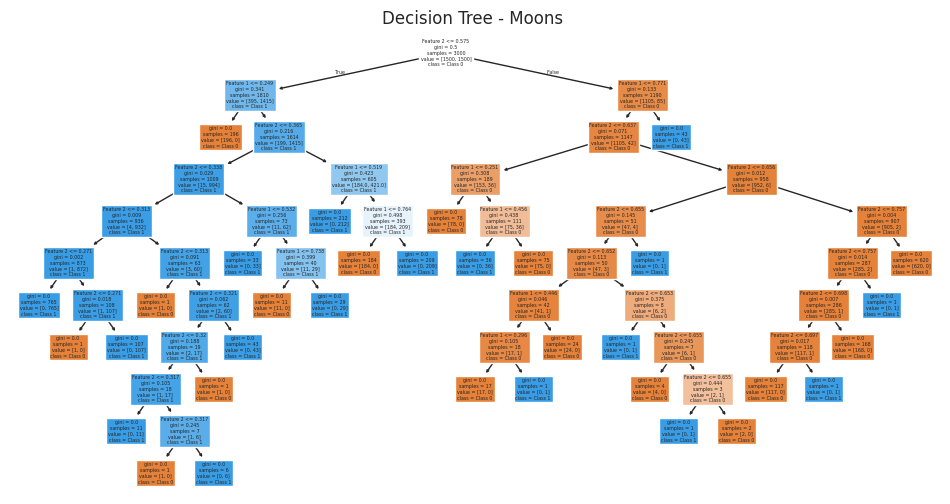

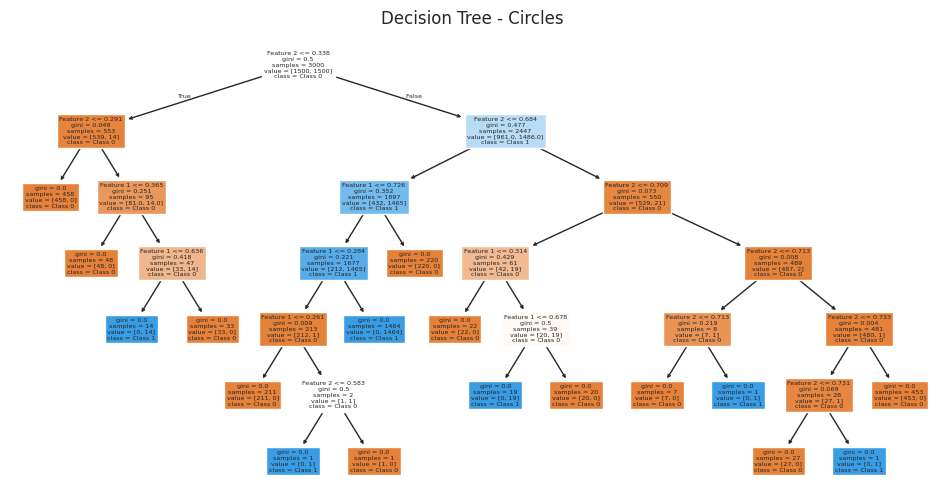

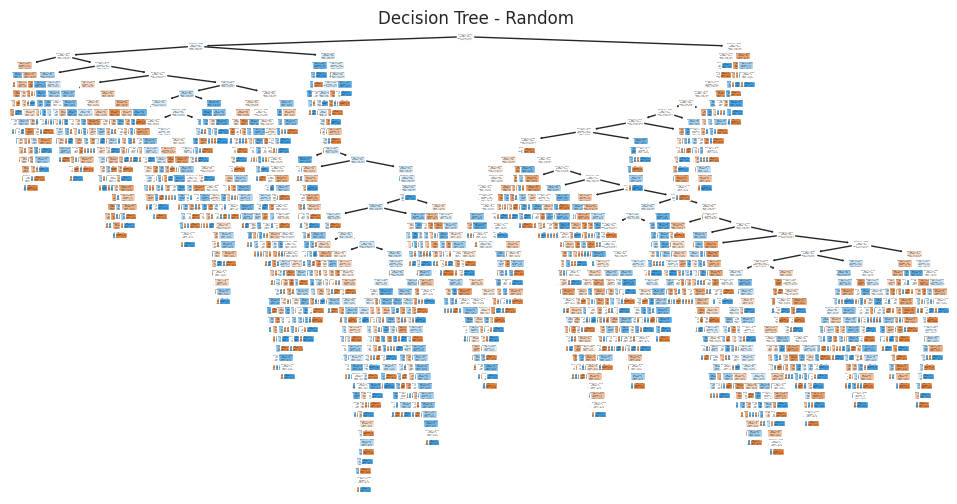

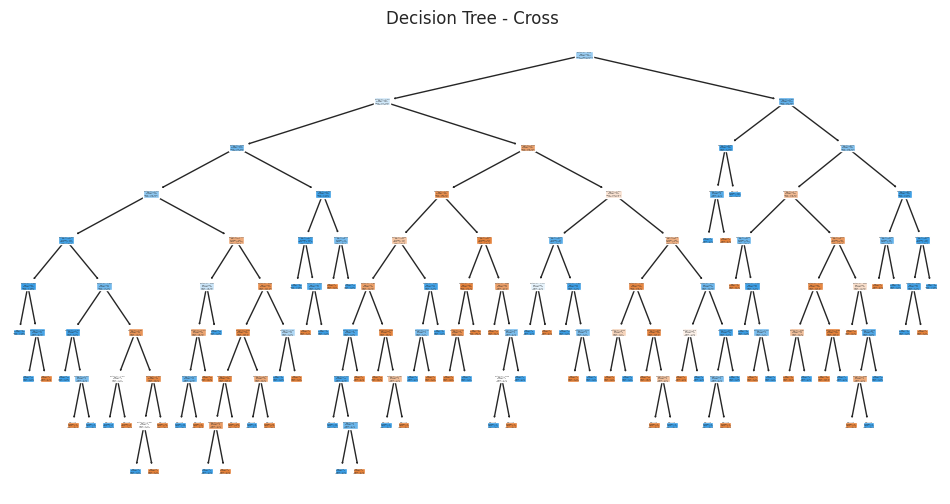

In [29]:
print("Decision Trees without pruning:")
plot_decision_trees_for_all_datasets(datasets)


Seperated - Decision Tree - Max Depth = 2
Accuracy (cross-validation): 1.0000 ± 0.0000


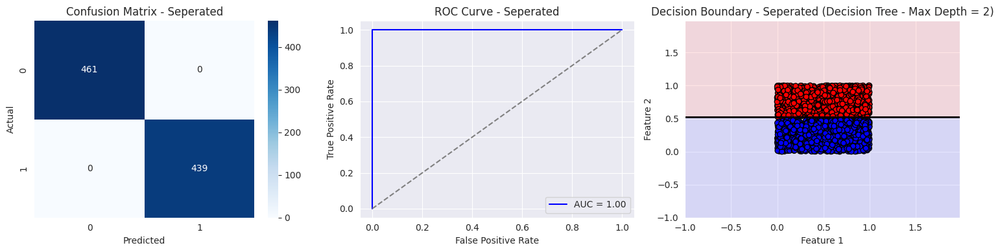

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Two Lines - Decision Tree - Max Depth = 2
Accuracy (cross-validation): 0.4743 ± 0.0310


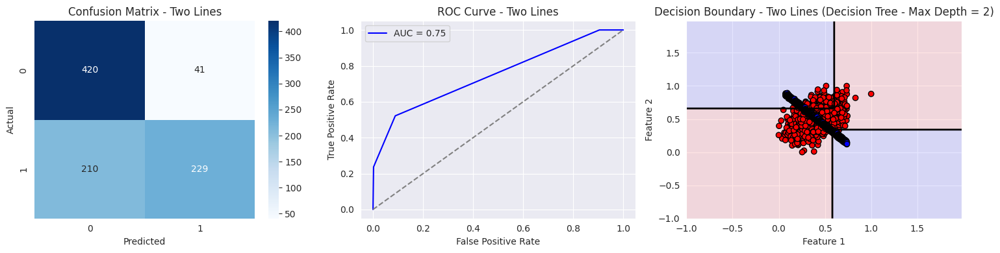

Classification Report:
              precision    recall  f1-score   support

         0.0       0.67      0.91      0.77       461
         1.0       0.85      0.52      0.65       439

    accuracy                           0.72       900
   macro avg       0.76      0.72      0.71       900
weighted avg       0.76      0.72      0.71       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Moons - Decision Tree - Max Depth = 2
Accuracy (cross-validation): 0.9090 ± 0.0084


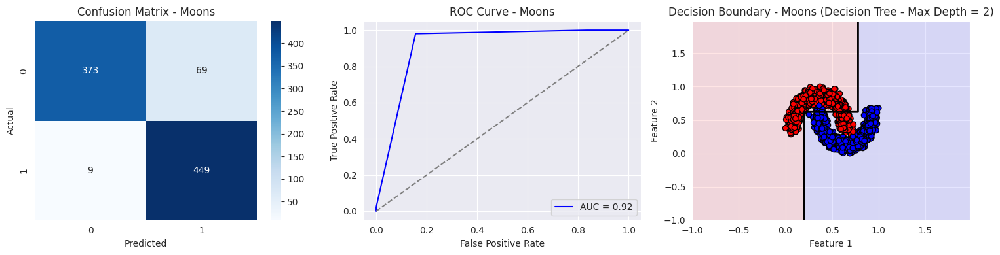

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.84      0.91       442
           1       0.87      0.98      0.92       458

    accuracy                           0.91       900
   macro avg       0.92      0.91      0.91       900
weighted avg       0.92      0.91      0.91       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Circles - Decision Tree - Max Depth = 2
Accuracy (cross-validation): 0.8393 ± 0.0090


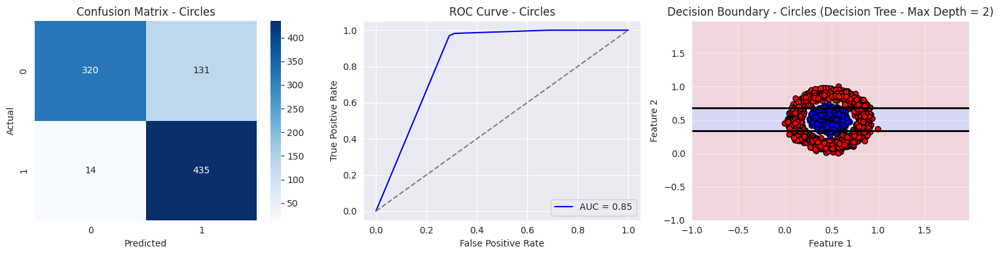

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.71      0.82       451
           1       0.77      0.97      0.86       449

    accuracy                           0.84       900
   macro avg       0.86      0.84      0.84       900
weighted avg       0.86      0.84      0.84       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Random - Decision Tree - Max Depth = 2
Accuracy (cross-validation): 0.4957 ± 0.0124


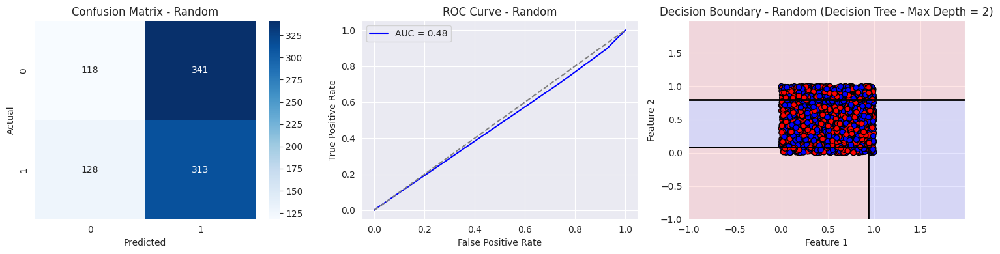

Classification Report:
              precision    recall  f1-score   support

           0       0.48      0.26      0.33       459
           1       0.48      0.71      0.57       441

    accuracy                           0.48       900
   macro avg       0.48      0.48      0.45       900
weighted avg       0.48      0.48      0.45       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Cross - Decision Tree - Max Depth = 2
Accuracy (cross-validation): 0.8050 ± 0.0085


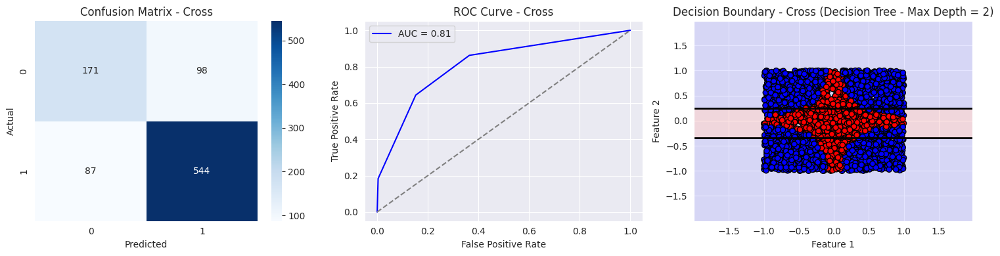

Classification Report:
              precision    recall  f1-score   support

           0       0.66      0.64      0.65       269
           1       0.85      0.86      0.85       631

    accuracy                           0.79       900
   macro avg       0.76      0.75      0.75       900
weighted avg       0.79      0.79      0.79       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [13]:
evaluate_model(DecisionTreeClassifier(max_depth=2), "Decision Tree - Max Depth = 2", datasets)


Decision Trees with max_depth=2:


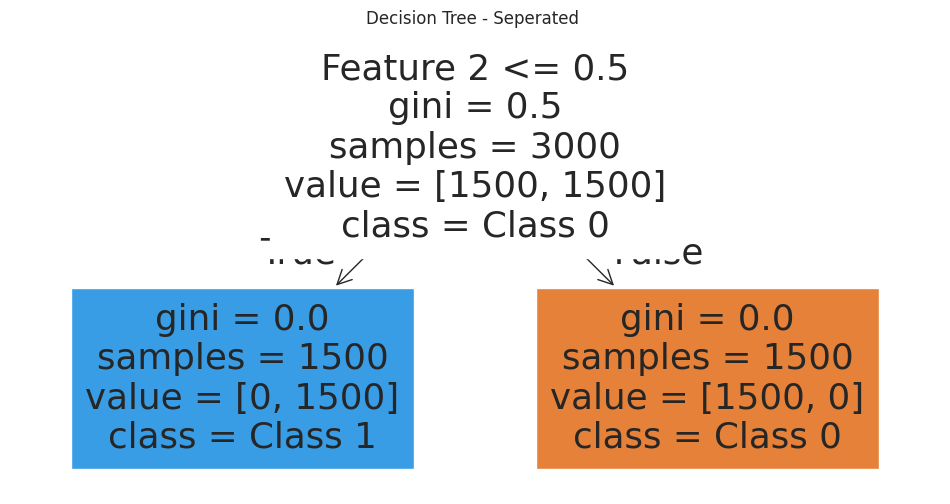

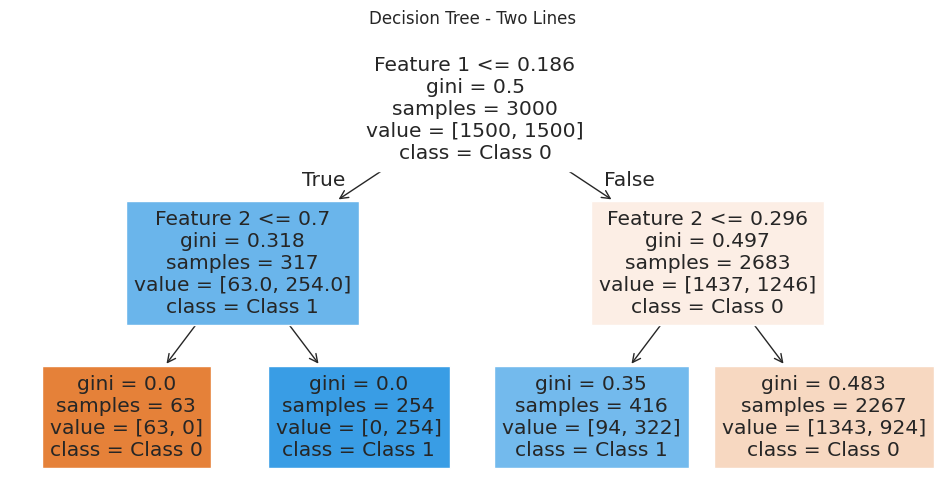

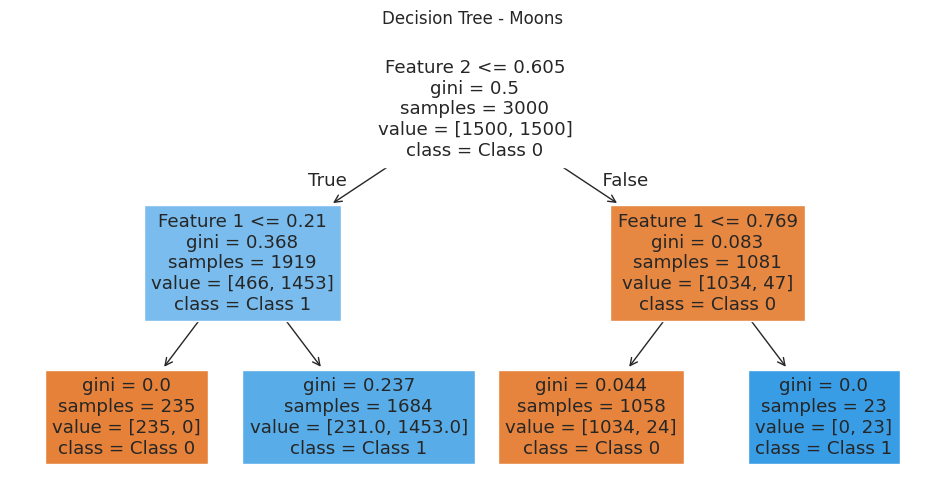

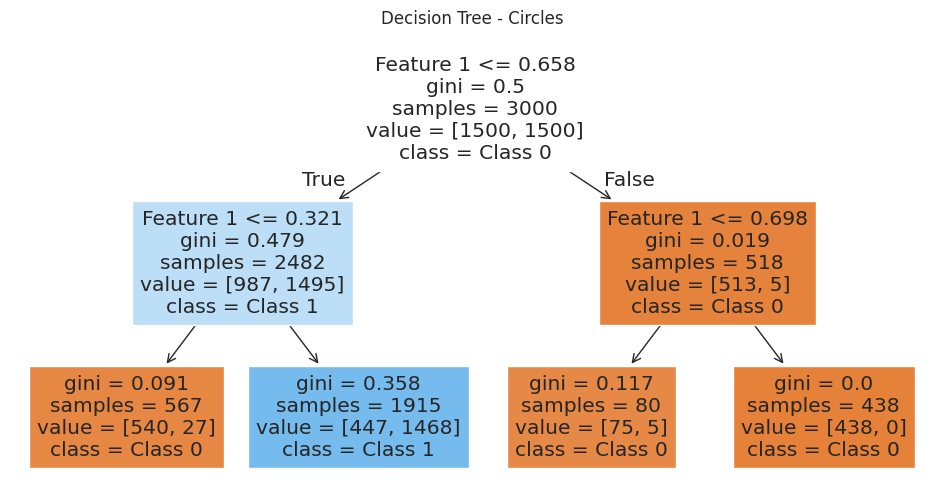

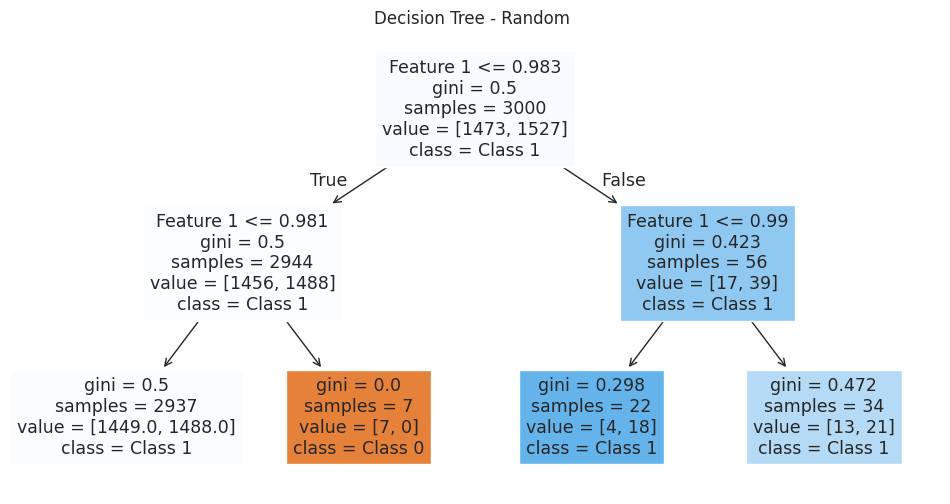

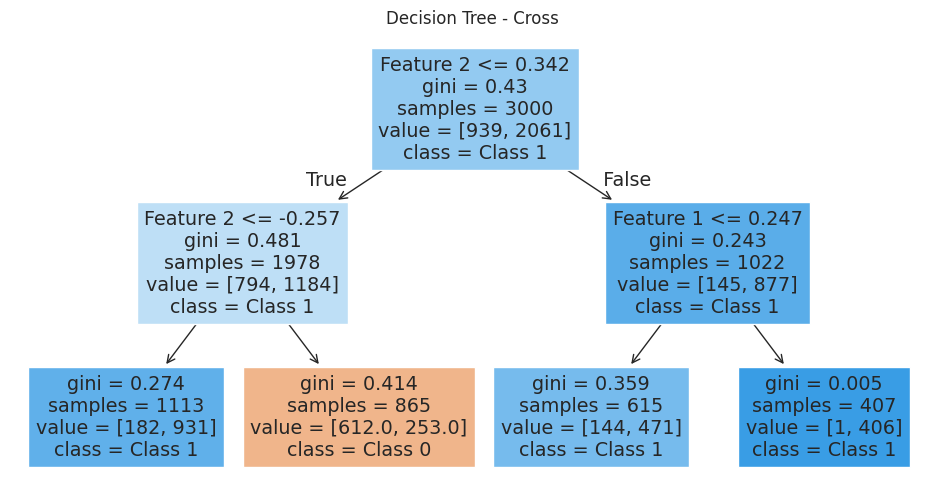

In [14]:
print("\nDecision Trees with max_depth=2:")
plot_decision_trees_for_all_datasets(datasets, max_depth=2)


Seperated - SVM Linear
Accuracy (cross-validation): 1.0000 ± 0.0000


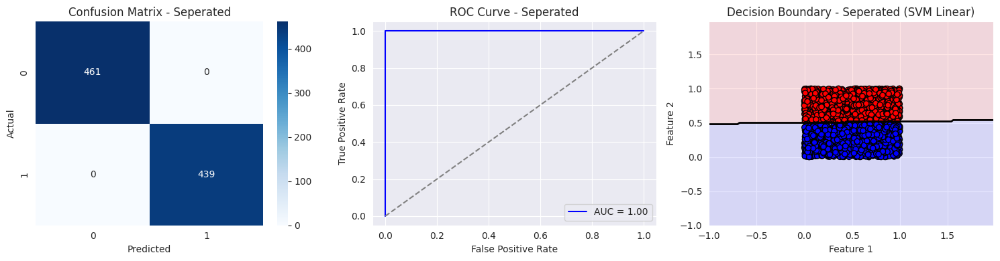

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Two Lines - SVM Linear
Accuracy (cross-validation): 0.4780 ± 0.0499


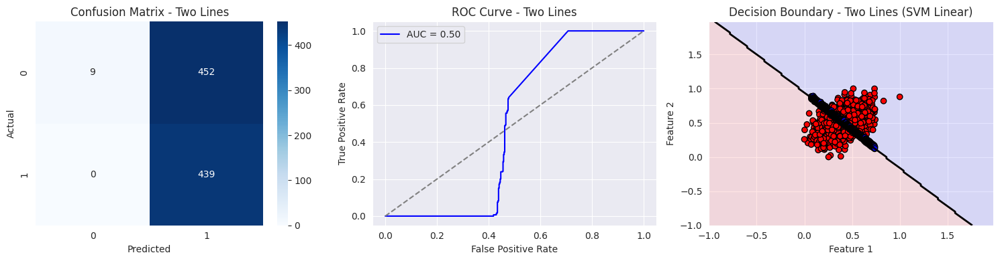

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.02      0.04       461
         1.0       0.49      1.00      0.66       439

    accuracy                           0.50       900
   macro avg       0.75      0.51      0.35       900
weighted avg       0.75      0.50      0.34       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Moons - SVM Linear
Accuracy (cross-validation): 0.8773 ± 0.0114


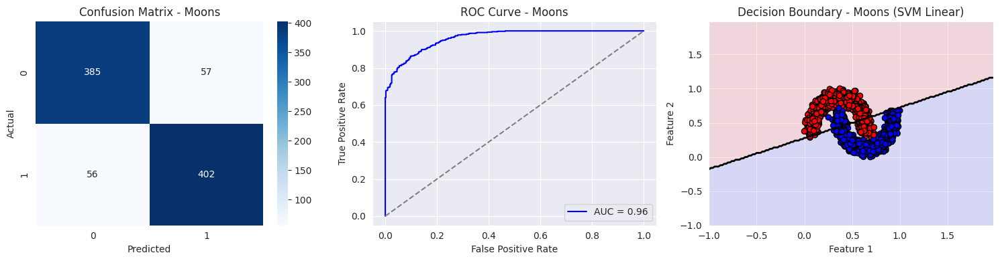

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       442
           1       0.88      0.88      0.88       458

    accuracy                           0.87       900
   macro avg       0.87      0.87      0.87       900
weighted avg       0.87      0.87      0.87       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Circles - SVM Linear
Accuracy (cross-validation): 0.6523 ± 0.0136


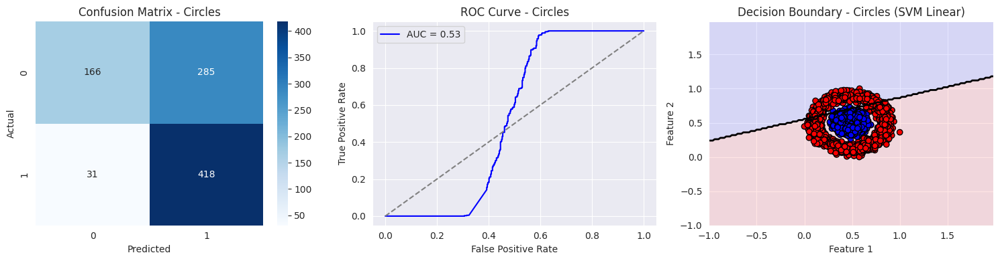

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.37      0.51       451
           1       0.59      0.93      0.73       449

    accuracy                           0.65       900
   macro avg       0.72      0.65      0.62       900
weighted avg       0.72      0.65      0.62       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Random - SVM Linear
Accuracy (cross-validation): 0.5090 ± 0.0008


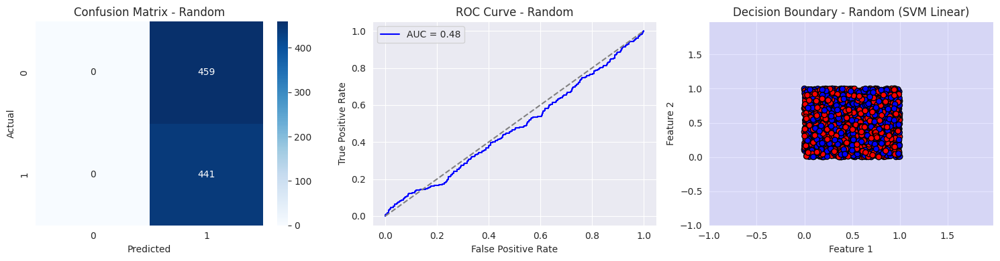

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.00      0.00       459
           1       0.49      1.00      0.66       441

    accuracy                           0.49       900
   macro avg       0.74      0.50      0.33       900
weighted avg       0.75      0.49      0.32       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Cross - SVM Linear
Accuracy (cross-validation): 0.6870 ± 0.0007


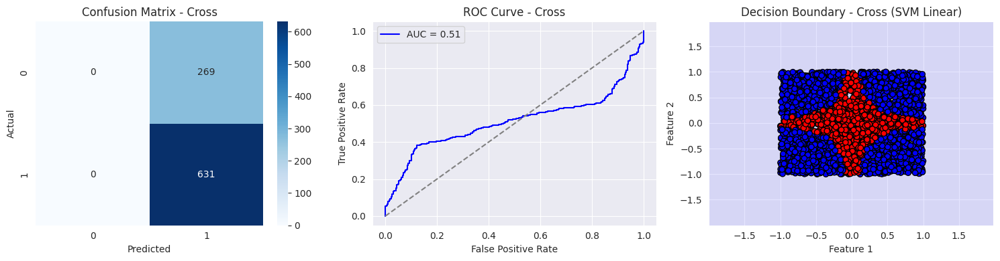

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.00      0.00       269
           1       0.70      1.00      0.82       631

    accuracy                           0.70       900
   macro avg       0.85      0.50      0.41       900
weighted avg       0.79      0.70      0.58       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [15]:
evaluate_model(SVC(kernel="linear", probability=True), "SVM Linear", datasets)


Seperated - SVM RBF
Accuracy (cross-validation): 1.0000 ± 0.0000


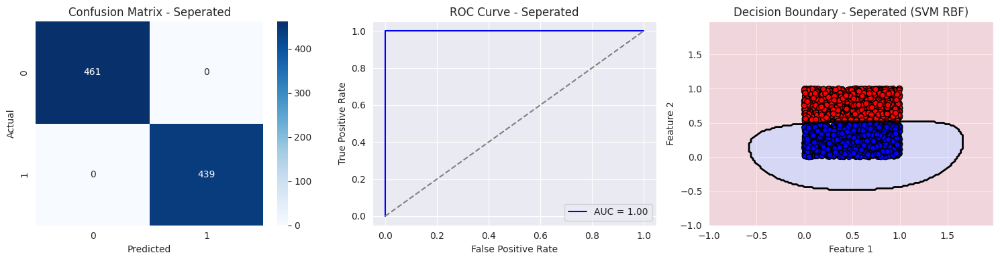

Classification Report Seperated:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       461
         1.0       1.00      1.00      1.00       439

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Two Lines - SVM RBF
Accuracy (cross-validation): 0.5823 ± 0.1024


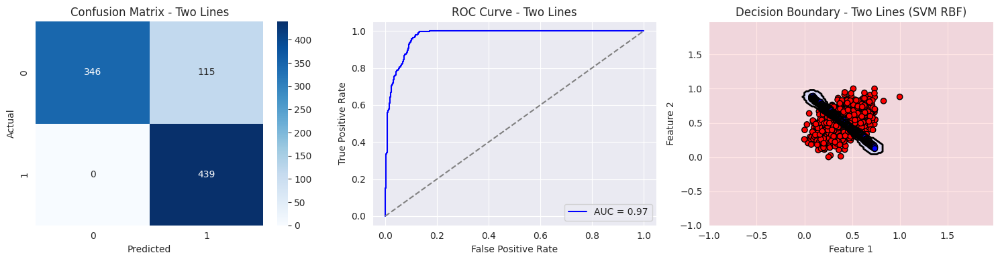

Classification Report Two Lines:
              precision    recall  f1-score   support

         0.0       1.00      0.75      0.86       461
         1.0       0.79      1.00      0.88       439

    accuracy                           0.87       900
   macro avg       0.90      0.88      0.87       900
weighted avg       0.90      0.87      0.87       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Moons - SVM RBF
Accuracy (cross-validation): 0.9990 ± 0.0008


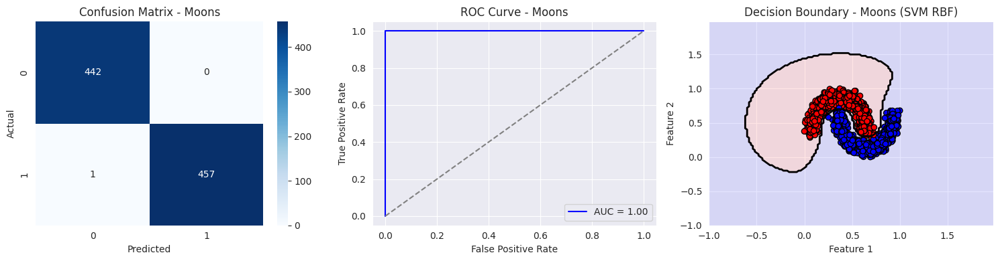

Classification Report Moons:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       442
           1       1.00      1.00      1.00       458

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Circles - SVM RBF
Accuracy (cross-validation): 0.9997 ± 0.0007


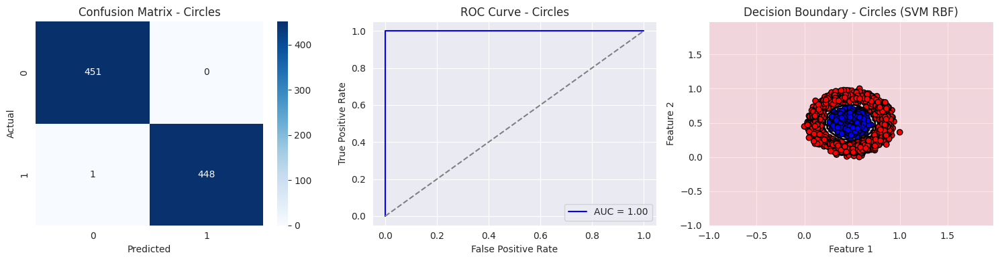

Classification Report Circles:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       451
           1       1.00      1.00      1.00       449

    accuracy                           1.00       900
   macro avg       1.00      1.00      1.00       900
weighted avg       1.00      1.00      1.00       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Random - SVM RBF
Accuracy (cross-validation): 0.5123 ± 0.0182


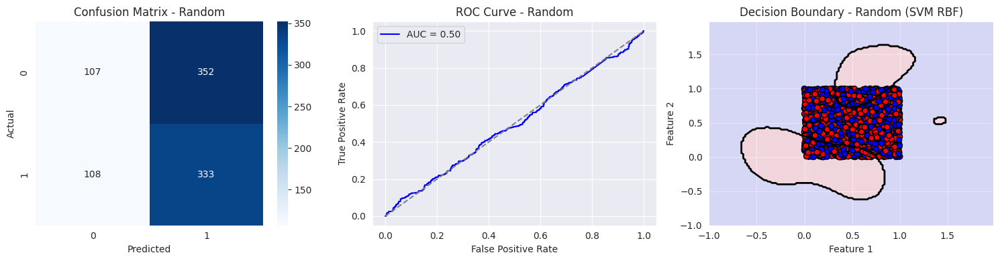

Classification Report Random:
              precision    recall  f1-score   support

           0       0.50      0.23      0.32       459
           1       0.49      0.76      0.59       441

    accuracy                           0.49       900
   macro avg       0.49      0.49      0.45       900
weighted avg       0.49      0.49      0.45       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'

Cross - SVM RBF
Accuracy (cross-validation): 0.9053 ± 0.0077


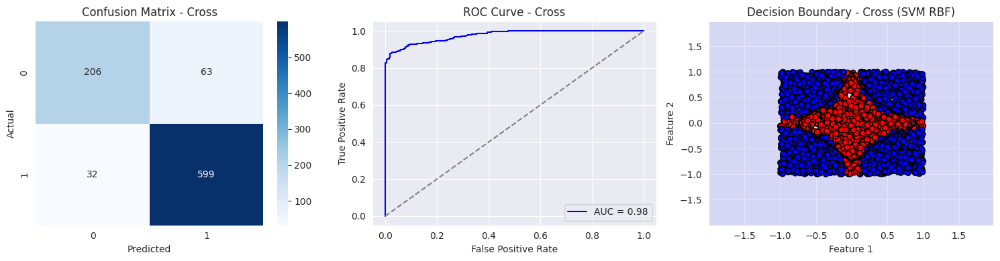

Classification Report Cross:
              precision    recall  f1-score   support

           0       0.87      0.77      0.81       269
           1       0.90      0.95      0.93       631

    accuracy                           0.89       900
   macro avg       0.89      0.86      0.87       900
weighted avg       0.89      0.89      0.89       900

Error plotting decision boundary: 'str' object has no attribute 'contourf'


In [19]:
evaluate_model(SVC(kernel="rbf", probability=True), "SVM RBF", datasets)


6